# Anonymous classification

The purpose of this exercise is to use a number of variables without context to classify a binary target variable.

## Setup

In [7]:
# !pip install numpy
# !pip install pandas
# !pip install matplotlib
# !pip install pystan
# !pip install pandas_profiling
# !pip install sklearn


# put histograms in 2D grid instead of list
# check correlations / interactions between variables after doing feature engineering
# add comments to profile reports
# add other comments to code


In [3]:
import pickle
import pystan
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from pandas_profiling import ProfileReport
from sklearn.metrics import precision_score, recall_score, f1_score, log_loss, roc_curve, precision_recall_curve, classification_report
from sklearn.preprocessing import StandardScaler

In [2]:
pd.options.display.max_columns = None
warnings.filterwarnings("ignore")

## Load data

In [4]:
train_data = pd.read_csv('training2.csv')
valid_data = pd.read_csv('validation2.csv')

After loading the data, we begin by having a thorough look at it. For this purpose, pandas_profiling is used. 

In [5]:
ProfileReport(train_data)

We make the following observations here:
- v15 is a multiple of v13 (10000x), so can be safely deleted (does not add any information)
- v17 is the same as the target variable, so can be deleted
- there are many rows with missing data; potential solution: for all categorial and boolean variables with missing values, create extra level for missing; then remove all rows that still have at least one missing value
- there are no categorical variables with a large number of levels, hence no need for reducing number of levels
- there is a lot of imbalance in the dataset in terms of the target variables
- v5 seems to have a uniform distribution, v6 seems to have a normal distribution and the other continuous variables are positive, skewed and most have a number of zeros

In [6]:
ProfileReport(valid_data)

We make the following observations here:
- the validation data seem to have the same structure as the training data, except for the fact that the classes are well balanced (there are also far fewer rows)


Now we'll have to massage the data, using our observations above

## Feature engineering

In [7]:
# adds columns so that the columns of df equal columns
def add_missing_dummy_columns(df, columns):
    missing_cols = set(columns) - set(df.columns)
    for c in missing_cols:
        df[c] = 0

# adds / deletes columns so that the columns of df equal columns
def fix_columns(df, columns):  

    add_missing_dummy_columns(df, columns)

    # make sure we have all the columns we need
    assert(set(columns) - set(df.columns) == set())

    # ensure resulting df has no cols that are not in columns   
    df = df[columns]
    return df  

In [8]:
def feature_engineering_1(df):
    df = df.drop(columns=['v15'])
    df = df.drop(columns=['v17'])
    cat_vars = df.dtypes[df.dtypes == 'O'].drop(index=['classLabel']).index
    for cat_var in cat_vars:
        df[cat_var] = df[cat_var].astype('category')
        df[cat_var] = df[cat_var].cat.add_categories('other').fillna('other')
    df = df.dropna()
    return df

In [9]:
def feature_engineering_2(train_df, valid_df, target_column):
    train_features = train_df.drop(columns=target_column)
    valid_features = valid_df.drop(columns=target_column)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(train_features)
    X_valid = scaler.transform(valid_features)
    constant = np.ones((len(X_train), 1))
    X_train = np.concatenate([constant, X_train], axis = 1)
    constant = np.ones((len(X_valid), 1))
    X_valid = np.concatenate([constant, X_valid], axis = 1)
    y_train = train_data[target_column].values
    y_valid = valid_data[target_column].values
    return X_train, y_train, X_valid, y_valid

In [10]:
train_data = feature_engineering_1(train_data)
valid_data = feature_engineering_1(valid_data)
train_data = pd.get_dummies(train_data, drop_first=True)
valid_data = pd.get_dummies(valid_data)
valid_data = fix_columns(valid_data, list(train_data.columns))
target_column = 'classLabel_yes.'
X_train, y_train, X_valid, y_valid = feature_engineering_2(train_data, valid_data, target_column)

## Estimating model

In [13]:
stan_code = \
"""
data {
    int<lower=1> n_rows_train;
    int<lower=1> n_rows_test;
    int<lower=1> n_variables;
    matrix[n_rows_train, n_variables] X_train;
    matrix[n_rows_test, n_variables] X_test;
    int<lower=0, upper=1> y_train[n_rows_train];
}

parameters{
   vector[n_variables] beta;
}

model{
   beta ~ normal(0,1);    
   y_train ~ bernoulli(inv_logit(X_train * beta));
}

generated quantities {
    int<lower=0, upper=1> y_pred_train[n_rows_train]; 
    int<lower=0, upper=1> y_pred_test[n_rows_test];
    
    y_pred_train = bernoulli_rng(inv_logit(X_train * beta));
    y_pred_test = bernoulli_rng(inv_logit(X_test * beta));
}
"""

In [14]:
# compile stan model
# sm = pystan.StanModel(model_code=stan_code)
# load stan model (compiled elsewhere)
sm = pickle.load(open('model.pkl', 'rb'))

In [15]:
stan_settings = \
    {
        "iter": 350,
        "warmup": 150,
        "chains": 1,
        "n_jobs": 1,
        "init": 0,
        "control": {"max_treedepth": 10},
        "seed": 1
    }

In [16]:
stan_data = \
    {
        'n_rows_train': X_train.shape[0],
        'n_rows_test': X_valid.shape[0],
        'n_variables': X_train.shape[1],
        'X_train': X_train,
        'X_test': X_valid,
        'y_train': y_train.astype('int'),
    }

In [17]:
fit = sm.sampling(data=stan_data, **stan_settings)
print(fit)

To run all diagnostics call pystan.check_hmc_diagnostics(fit)


Inference for Stan model: anon_model_8e2c71695caa3f7fc23d8ae0351cb22f.
1 chains, each with iter=350; warmup=150; thin=1; 
post-warmup draws per chain=200, total post-warmup draws=200.

                      mean se_mean     sd   2.5%    25%    50%    75%  97.5%  n_eff   Rhat
beta[1]               5.09    0.03   0.24   4.58   4.93   5.07   5.27   5.57     83   1.01
beta[2]              -0.42  7.7e-3   0.12  -0.63  -0.51  -0.42  -0.33  -0.18    228   1.01
beta[3]              -0.29    0.01   0.14  -0.59  -0.38  -0.29   -0.2  -0.05    182    1.0
beta[4]               0.05  5.2e-3   0.11  -0.14  -0.03   0.05   0.13   0.25    435    1.0
beta[5]               1.57    0.01   0.12   1.38   1.48   1.55   1.65   1.81     78   1.03
beta[6]               0.72    0.02   0.21   0.33   0.57   0.71   0.84   1.13    170    1.0
beta[7]               1.16    0.03   0.35   0.51   0.93   1.13   1.42   1.82    129    1.0
beta[8]              -0.04  5.9e-3   0.11  -0.26  -0.12  -0.03   0.04   0.16    320    

## Posterior plot

In [18]:
variable_columns = ['constant'] + list(train_data.drop(columns=target_column).columns)

In [19]:
beta_samples = fit.extract()['beta']

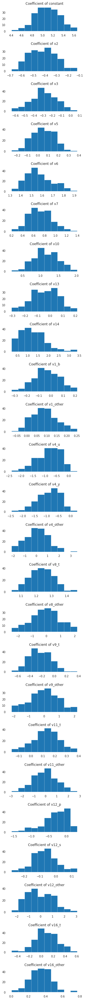

In [20]:
fig, axs = plt.subplots(beta_samples.shape[1], figsize=(5, 50))
fig.tight_layout(pad=3.0) 

for i in np.arange(len(axs)):
    axs[i].set_title(f'Coefficient of {variable_columns[i]}')
    axs[i].hist(beta_samples[:, i])
plt.show()

## Posterior predictive plot

In [21]:
y_pred_samples_train = fit.extract()['y_pred_train']
y_pred_samples_valid = fit.extract()['y_pred_test']

First Property:
Scaled feature values: [ 1.         -0.03789421  0.28611372  0.30833376 -1.7555618  -0.43545859
 -0.62190645  1.64811328 -0.25233711  0.74255891 -0.10521459  0.43874917
 -0.42410008  0.          0.38364302  0.         -1.26266346  0.
  1.01413698  0.         -0.06924945  4.22451901  0.         -0.62084872
  0.84556107]
Target value: 0
Posterior predictive distribution: 


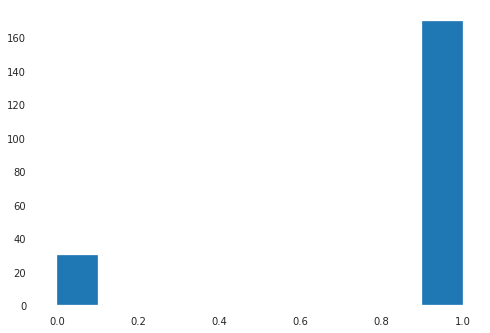

In [22]:
print('First Property:')
print(f'Scaled feature values: {X_valid[0, :]}')
print(f'Target value: {y_valid[0]}')
print('Posterior predictive distribution: ')
plt.hist(y_pred_samples_valid[:, 0])
plt.show()

Because this posterior predictive can be fully summarised by a single number (fraction of ones), we will collapse the distribution into a single number:

In [23]:
y_pred_proba_train = y_pred_samples_train.mean(axis=0)
y_pred_proba_valid = y_pred_samples_valid.mean(axis=0)


## Performance check

### Training data

In [24]:
log_loss_model = log_loss(y_train, y_pred_proba_train)
log_loss_naive = log_loss(y_train, [y_train.mean()] * len(y_train))
print('Log loss full model: ', log_loss_model)
print('Log loss of benchmark model: ', log_loss_naive)
print('Relative improvement of model over benchmark (R squared like): ', 1 - log_loss_model / log_loss_naive)


Log loss full model:  0.10993291486920548
Log loss of benchmark model:  0.2655726073171224
Relative improvement of model over benchmark (R squared like):  0.586053260613834


### Validation data

In [25]:
log_loss_model_valid = log_loss(y_valid, y_pred_proba_valid)
log_loss_naive_valid = log_loss(y_valid, [y_train.mean()] * len(y_valid))
print('Log loss full model: ', log_loss_model_valid)
print('Log loss of benchmark model: ', log_loss_naive_valid)
print('Relative improvement of model over benchmark (R squared like): ', 1 - log_loss_model_valid / log_loss_naive_valid)

Log loss full model:  1.1379069163539905
Log loss of benchmark model:  1.3879931233718625
Relative improvement of model over benchmark (R squared like):  0.18017827524270125


## Rerun pipeline with continuous data transformations

### Re-engineering features

In [26]:
skewed_vars = ['v2', 'v3', 'v7', 'v10', 'v13', 'v14']
for var in skewed_vars:
    train_data[var] = np.log(1 + train_data[var])
    valid_data[var] = np.log(1 + valid_data[var])

In [27]:
X_train, y_train, X_valid, y_valid = feature_engineering_2(train_data, valid_data, target_column)

### Refitting the model

In [28]:
stan_data = \
    {
        'n_rows_train': X_train.shape[0],
        'n_rows_test': X_valid.shape[0],
        'n_variables': X_train.shape[1],
        'X_train': X_train,
        'X_test': X_valid,
        'y_train': y_train.astype('int'),
    }
fit = sm.sampling(data=stan_data, **stan_settings)

To run all diagnostics call pystan.check_hmc_diagnostics(fit)


In [29]:
y_pred_proba_train = fit.extract()['y_pred_train'].mean(axis=0)
y_pred_proba_valid = fit.extract()['y_pred_test'].mean(axis=0)

### Performance training data

In [30]:
log_loss_model = log_loss(y_train, y_pred_proba_train)
log_loss_naive = log_loss(y_train, [y_train.mean()] * len(y_train))
print('Log loss full model: ', log_loss_model)
print('Log loss of benchmark model: ', log_loss_naive)
print('Relative improvement of model over benchmark (R squared like): ', 1 - log_loss_model / log_loss_naive)

Log loss full model:  0.11710232224147359
Log loss of benchmark model:  0.2655726073171224
Relative improvement of model over benchmark (R squared like):  0.5590572257264441


### Performance validation data

In [31]:
log_loss_model_valid = log_loss(y_valid, y_pred_proba_valid)
log_loss_naive_valid = log_loss(y_valid, [y_train.mean()] * len(y_valid))
print('Log loss full model: ', log_loss_model_valid)
print('Log loss of benchmark model: ', log_loss_naive_valid)
print('Relative improvement of model over benchmark (R squared like): ', 1 - log_loss_model_valid / log_loss_naive_valid)

Log loss full model:  1.103362777020402
Log loss of benchmark model:  1.3879931233718625
Relative improvement of model over benchmark (R squared like):  0.2050661069991513


## Optimising classification decision threshold

Here we try to find the optimal threshold, such that a particular criterion (generalised f1-score) is optimised. Results will depend on the criterion.

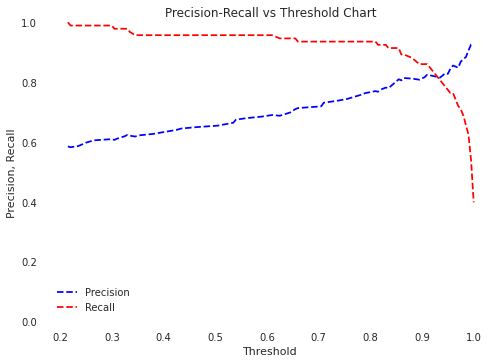

In [32]:
precision, recall, thresholds = precision_recall_curve(y_valid, y_pred_proba_valid) 

plt.title("Precision-Recall vs Threshold Chart")
plt.plot(thresholds, precision[: -1], "b--", label="Precision")
plt.plot(thresholds, recall[: -1], "r--", label="Recall")
plt.ylabel("Precision, Recall")
plt.xlabel("Threshold")
plt.legend(loc="lower left")
plt.ylim([0,1])
plt.show()

In [33]:
def comp_gen_f1_score(recall, precision, beta):
    beta_sqt = np.power(beta, 2)
    gen_f1 = (1 + beta_sqt) * precision * recall / (recall + beta_sqt * precision)
    return gen_f1

In [34]:
df_scores = pd.DataFrame(data = {'thresholds': thresholds, 'precision': precision[: -1], 'recall': recall[: -1]})
beta = 1 # use standard f1-score for now
df_scores['gen_f1'] = comp_gen_f1_score(df_scores['recall'], df_scores['precision'], beta)
opt_index = df_scores['gen_f1'].idxmax()
opt_threshold = df_scores.loc[opt_index, 'thresholds']
print('Optimal decision threshold: ', opt_threshold)
print('Optimal general f1 score: ', df_scores.loc[opt_index, 'gen_f1'])
print('Optimal recall: ', df_scores.loc[opt_index, 'recall'])
print('Optimal precision: ', df_scores.loc[opt_index, 'precision'])



Optimal decision threshold:  0.855
Optimal general f1 score:  0.8585858585858587
Optimal recall:  0.9139784946236559
Optimal precision:  0.8095238095238095


## Classifying properties

In [35]:
y_pred_valid = np.array([1 if pred > opt_threshold else 0 for pred in y_pred_proba_valid])

In [36]:
pred_valid_df = pd.DataFrame(y_pred_valid, index=valid_data.index, columns=['pred'])

In [37]:
pred_valid_df.to_csv('predictions.csv')

## Notes

- We did not do cross-validation / regularisation because it is time consuming and because, when using the posterior predictive distribution (in Bayesian inference), regularisation is not essential (we are not optimising)
- We did not do class balancing before estimating the logistic regression model, because this is relevant for decision making, not inference; instead we tuned the decision threshold
- My guess is that the training data was simulated and the validation data was taken as a subset of the training data

## Future work

- Incorporate variable interactions